# Data Science - Third Assignment - Brazillian E-commerce Analysis
# Mohammad Hossein Basouli - 401222020
---

# Imports

In [36]:
import scipy.stats as stats
import numpy as np
import pandas as pd

import math

from sklearn.cluster import KMeans, DBSCAN
from sklearn.decomposition import PCA
from sklearn.manifold import TSNE
from sklearn.neighbors import NearestNeighbors

from sklearn.metrics import silhouette_score
from sklearn.preprocessing import StandardScaler

from tqdm import tqdm

import seaborn as sns
import matplotlib.pylab as plt
plt.style.use('ggplot')
from mpl_toolkits.mplot3d import Axes3D  # Required for 3D plotting
import plotly.express as px
import plotly.graph_objects as go

import gc

pd.set_option('display.max_columns', 35)

# Loading the Datasets

In [37]:
customers_df = pd.read_csv('dataset/olist_customers_dataset.csv')
geolocation_df = pd.read_csv('dataset/olist_geolocation_dataset.csv')
order_items_df = pd.read_csv('dataset/olist_order_items_dataset.csv')
order_payments_df = pd.read_csv('dataset/olist_order_payments_dataset.csv')
order_reviews_df = pd.read_csv('dataset/olist_order_reviews_dataset.csv')
orders_df = pd.read_csv('dataset/olist_orders_dataset.csv')
products_df = pd.read_csv('dataset/olist_products_dataset.csv')
sellers_df = pd.read_csv('dataset/olist_sellers_dataset.csv')

# Exploratory Data Analyis

## Data Preprocessing

### Missing Values (before joins)

#### Imputation of Crutial Missing Values in **Products** Data Frame by mean:

In [39]:
products_df['product_weight_g'] = products_df['product_weight_g'].fillna(products_df['product_weight_g'].mean())
products_df['product_width_cm'] = products_df['product_width_cm'].fillna(products_df['product_width_cm'].mean())
products_df['product_height_cm'] = products_df['product_height_cm'].fillna(products_df['product_height_cm'].mean())
products_df['product_length_cm'] = products_df['product_length_cm'].fillna(products_df['product_length_cm'].mean())

### Consistency Issues

#### Deletion of Orders That Don't Exist in *olist_order_items_dataset*:

In [41]:
orders_not_in_order_item_list_df = order_items_df.merge(right=orders_df, on='order_id', how='right', indicator=True)
orders_not_in_order_item_list_df = orders_not_in_order_item_list_df[orders_not_in_order_item_list_df['_merge'] == 'right_only']
orders_not_in_order_item_list = orders_not_in_order_item_list_df['order_id'].unique()

print(f"The total number of orders that are in olist_orders_dataset but not in olist_order_items_dataset: {orders_not_in_order_item_list.shape[0]}")

orders_df = orders_df[~orders_df['order_id'].isin(orders_not_in_order_item_list)]

The total number of orders that are in olist_orders_dataset but not in olist_order_items_dataset: 775


#### Deletion of Orders That Don't Exist in *olist_order_payments_dataset*:

In [42]:
orders_not_in_payment_list_df = order_payments_df.merge(right=orders_df, on='order_id', how='right', indicator=True)
orders_not_in_payment_list_df = orders_not_in_payment_list_df[orders_not_in_payment_list_df['_merge'] == 'right_only']
orders_not_in_payment_list = orders_not_in_payment_list_df['order_id'].unique()

print(f"The total number of orders that are in olist_orders_dataset but not in olist_order_payments_dataset: {orders_not_in_payment_list.shape[0]}")

orders_df = orders_df[~orders_df['order_id'].isin(orders_not_in_payment_list)]

The total number of orders that are in olist_orders_dataset but not in olist_order_payments_dataset: 1


## Feature Engineering

*Two Basic Joins That Will be Used For Future Aggregations*:

In [43]:
orders_payments_merge = orders_df.merge(right=order_payments_df, on='order_id')
orders_order_items_merge = orders_df.merge(right=order_items_df, on='order_id')

### Adding Proportion of Each **Payment Type** Used by Each User:

In [44]:
customers_payment_types_proportions = orders_payments_merge.groupby(by='customer_id', as_index=False)['payment_type'].value_counts(normalize=True)
proportion_of_payment_types_df = pd.DataFrame(customers_payment_types_proportions['customer_id'].unique(), columns=['customer_id'])

pivot = customers_payment_types_proportions.pivot(index='customer_id', columns='payment_type', values='proportion')

pivot.columns = [f'payment_by_{col}_proportion' for col in pivot.columns]

pivot = pivot.reset_index()

proportion_of_payment_types_df = proportion_of_payment_types_df.merge(pivot, on='customer_id')
proportion_of_payment_types_df.fillna(0, inplace=True)

customers_df = customers_df.merge(right=proportion_of_payment_types_df, on='customer_id')

### Adding Statistics About **Payment Details**:

In [45]:
customer_payment_value_agg = orders_payments_merge.groupby(by='customer_id', as_index=False)['payment_value'].agg(func=['min', 'max', 'mean', 'sum']).rename(columns={'min': 'min_payment_value', 'max': 'max_payment_value', 'mean': 'avg_payment_value', 'sum': 'total_payment_value'})
customer_payment_installments_agg = orders_payments_merge.groupby(by='customer_id', as_index=False)['payment_installments'].agg(func=['min', 'max', 'mean', 'sum']).rename(columns={'min': 'min_payment_installments', 'max': 'max_payment_installments', 'mean': 'avg_payment_installments', 'sum': 'total_payment_installments'})
customer_payment_agg = customer_payment_value_agg.merge(right=customer_payment_installments_agg, on='customer_id')

customers_df = customers_df.merge(right=customer_payment_agg, on='customer_id')

### Adding Statistics About **Product Volume**, **Product Weight** and **Distinct Number of Products** Bought by The Customer:

In [46]:
products_df['product_volume_cm3'] = products_df['product_width_cm'] * products_df['product_length_cm'] * products_df['product_height_cm']
products_order_item_merge = order_items_df.merge(products_df, on='product_id')
orders_products_order_items_merge = orders_df.merge(products_order_item_merge, on='order_id')

product_volume_agg = orders_products_order_items_merge.groupby(by='customer_id', as_index=False)['product_volume_cm3'].agg(func=['min', 'max', 'mean', 'sum']).rename(columns={'min': 'min_product_volume', 'max': 'max_product_volume', 'mean': 'avg_product_volume', 'sum': 'total_product_volume'})
product_weight_agg = orders_products_order_items_merge.groupby(by='customer_id', as_index=False)['product_weight_g'].agg(func=['min', 'max', 'mean', 'sum']).rename(columns={'min': 'min_product_weight', 'max': 'max_product_weight', 'mean': 'avg_product_weight', 'sum': 'total_product_weight'})
customer_distinct_product_agg = orders_products_order_items_merge.groupby(by='customer_id', as_index=False)['product_id'].nunique().rename(columns={'product_id': '#_of_distinct_bought_products'})

customers_df = customers_df.merge(right=product_volume_agg, on='customer_id')
customers_df = customers_df.merge(right=product_weight_agg, on='customer_id')
customers_df = customers_df.merge(right=customer_distinct_product_agg, on='customer_id')

### Adding Statistics About **Freight Value**:

In [47]:
freight_value_agg =  orders_order_items_merge.groupby(by='customer_id')['freight_value'].agg(func=['min', 'max', 'mean', 'sum']).rename(columns={'min': 'min_freight_value', 'max': 'max_freight_value', 'mean': 'avg_freight_value', 'sum': 'total_freight_value'})

customers_df = customers_df.merge(right=freight_value_agg, on='customer_id')

### Adding Statistics About **Review Score**:

In [48]:
orders_review_merge =  orders_df.merge(right=order_reviews_df, on='order_id')
review_score_agg = orders_review_merge.groupby(by='customer_id', as_index=False)['review_score'].agg(func=['min', 'max', 'mean', 'sum']).rename(columns={'min': 'min_review_score', 'max': 'max_review_score', 'mean': 'avg_review_score', 'sum': 'total_review_score'})

customers_df = customers_df.merge(right=review_score_agg, on='customer_id', how='left')

### Adding **Distinct Number of Sellers** That Customer has Bought Something From:

In [49]:
customer_distinct_sellers =  orders_order_items_merge.groupby(by='customer_id', as_index=False)['seller_id'].nunique().rename(columns={'seller_id': '#_of_distinct_sellers'})

customers_df = customers_df.merge(right=customer_distinct_sellers, on='customer_id')

*Features after **Feature Enginnering***:

In [50]:
customers_df.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 98665 entries, 0 to 98664
Data columns (total 35 columns):
 #   Column                             Non-Null Count  Dtype  
---  ------                             --------------  -----  
 0   customer_id                        98665 non-null  object 
 1   customer_unique_id                 98665 non-null  object 
 2   customer_zip_code_prefix           98665 non-null  int64  
 3   customer_city                      98665 non-null  object 
 4   customer_state                     98665 non-null  object 
 5   payment_by_boleto_proportion       98665 non-null  float64
 6   payment_by_credit_card_proportion  98665 non-null  float64
 7   payment_by_debit_card_proportion   98665 non-null  float64
 8   payment_by_voucher_proportion      98665 non-null  float64
 9   min_payment_value                  98665 non-null  float64
 10  max_payment_value                  98665 non-null  float64
 11  avg_payment_value                  98665 non-null  flo

## Missing Values (after joins)

### Handling Missing Values for **Review Score** by mean:

In [80]:
customers_df.isna().sum()

customer_id                          0
customer_unique_id                   0
customer_zip_code_prefix             0
customer_city                        0
customer_state                       0
payment_by_boleto_proportion         0
payment_by_credit_card_proportion    0
payment_by_debit_card_proportion     0
payment_by_voucher_proportion        0
min_payment_value                    0
max_payment_value                    0
avg_payment_value                    0
total_payment_value                  0
min_payment_installments             0
max_payment_installments             0
avg_payment_installments             0
total_payment_installments           0
min_product_volume                   0
max_product_volume                   0
avg_product_volume                   0
total_product_volume                 0
min_product_weight                   0
max_product_weight                   0
avg_product_weight                   0
total_product_weight                 0
#_of_distinct_bought_prod

In [81]:
customers_df['min_review_score'] = customers_df['min_review_score'].fillna(customers_df['min_review_score'].mean())
customers_df['max_review_score'] = customers_df['max_review_score'].fillna(customers_df['max_review_score'].mean())
customers_df['avg_review_score'] = customers_df['avg_review_score'].fillna(customers_df['avg_review_score'].mean())
customers_df['total_review_score'] = customers_df['total_review_score'].fillna(customers_df['total_review_score'].mean())

customers_df.isna().sum()

customer_id                          0
customer_unique_id                   0
customer_zip_code_prefix             0
customer_city                        0
customer_state                       0
payment_by_boleto_proportion         0
payment_by_credit_card_proportion    0
payment_by_debit_card_proportion     0
payment_by_voucher_proportion        0
min_payment_value                    0
max_payment_value                    0
avg_payment_value                    0
total_payment_value                  0
min_payment_installments             0
max_payment_installments             0
avg_payment_installments             0
total_payment_installments           0
min_product_volume                   0
max_product_volume                   0
avg_product_volume                   0
total_product_volume                 0
min_product_weight                   0
max_product_weight                   0
avg_product_weight                   0
total_product_weight                 0
#_of_distinct_bought_prod

# Model Training

1. Baseline Clustering
    1. K-Means with PCA
    2. K-Means with t-SNE

2. Model Variant (DBSCAN with t-SNE)

*Dropping Irrelavant Features*:

In [53]:
df_kmeans = customers_df.drop(columns=['customer_id', 'customer_unique_id', 'customer_zip_code_prefix',
       'customer_city', 'customer_state'])
df_dbscan = df_kmeans.copy()

## 1. Baseline Clustering

### 1.1 K-Means with PCA:

#### 1.1.1 Scaling

In [54]:
scaler_kmeans_pca = StandardScaler()
X_kmeans_pca_scaled = scaler_kmeans_pca.fit_transform(df_kmeans) 

#### 1.1.2 Dimension Reduction via **PCA** (%95 of the variance):

In [55]:
pca_kmeans = PCA(n_components=0.95)
X_kmeans_pca = pca_kmeans.fit_transform(X_kmeans_pca_scaled)

#### 1.1.3 Specifying The Best Number of Clusterings via **Elbow Curve** (***Inertial*** & ***Silhouette*** Score as Clustering Evaluation Metrics) for K-means:

100%|██████████| 8/8 [04:44<00:00, 35.52s/it]


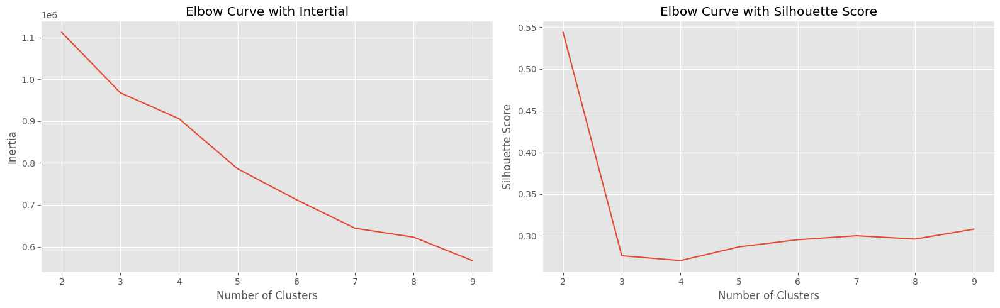

In [56]:
temp_sampled_df_kmeans_pca = df_kmeans.sample(frac=0.5, random_state=42)

temp_scaler_kmeans_pca = StandardScaler()
temp_X_kmeans_pca_scaled = temp_scaler_kmeans_pca.fit_transform(temp_sampled_df_kmeans_pca) 

temp_pca_kmeans = PCA(n_components=0.95)
temp_X_kmeans_pca = temp_pca_kmeans.fit_transform(temp_X_kmeans_pca_scaled)

k_values = range(2, 10)

inertia = []
sil_scores = []
for k in tqdm(k_values):
    temp_kmeans = KMeans(n_clusters=k, random_state=42)
    temp_labels = temp_kmeans.fit_predict(temp_X_kmeans_pca)
    score = silhouette_score(temp_X_kmeans_pca, temp_labels)
    inertia.append(temp_kmeans.inertia_)
    sil_scores.append(score)

fig, axs = plt.subplots(1, 2, figsize=(16, 5))

sns.lineplot(x=k_values, y=inertia, ax=axs[0], markers='o')
axs[0].set_xlabel('Number of Clusters')
axs[0].set_ylabel('Inertia')
axs[0].set_title('Elbow Curve with Intertial')

sns.lineplot(x=k_values, y=sil_scores, ax=axs[1], markers='o')
axs[1].set_xlabel('Number of Clusters')
axs[1].set_ylabel('Silhouette Score')
axs[1].set_title('Elbow Curve with Silhouette Score')

axs[0].grid(True)
axs[1].grid(True)

plt.tight_layout()
plt.show()

#### 1.1.4 Training K-means With the Best Clustering Number:

In [57]:
kmeans_pca = KMeans(n_clusters=2, random_state=42)
kmeans_pca_labels = kmeans_pca.fit_predict(X_kmeans_pca)

df_kmeans_pca = df_kmeans.copy()
df_kmeans_pca['label'] = kmeans_pca_labels.astype(str)

#### 1.1.4 Cluster Overlays on PCA:

##### 1.1.4.1 Three Dimentional Graph:

In [58]:
# DataFrame with PCA components and cluster labels
df_kmeans_pca_3d = pd.DataFrame(X_kmeans_pca[:, 0:3], columns=['PCA1', 'PCA2', 'PCA3'])
df_kmeans_pca_3d['Cluster'] = kmeans_pca_labels.astype(str)

# Create base 3D scatter plot for data points
fig = px.scatter_3d(df_kmeans_pca_3d, x='PCA1', y='PCA2', z='PCA3',
                    color='Cluster',
                    color_discrete_sequence=px.colors.qualitative.Vivid,
                    opacity=0.8)

# Get PCA-transformed centroids (assuming kmeans was run on original or PCA-reduced data)
centroids_kmeans_pca_3d = kmeans_pca.cluster_centers_[:, :3]

# Add centroids with standout styling
fig.add_trace(go.Scatter3d(
    x=centroids_kmeans_pca_3d[:, 0],
    y=centroids_kmeans_pca_3d[:, 1],
    z=centroids_kmeans_pca_3d[:, 2],
    mode='markers+text',
    marker=dict(
        size=14,  # Bigger size
        color='yellow',  # Bright contrasting color
        symbol='diamond',  # Distinctive shape
        line=dict(color='black', width=2)  # Outline for better visibility
    ),
    text=[f'Centroid {i}' for i in range(len(centroids_kmeans_pca_3d))],
    textposition='top center',
    name='Centroids'
))

# Update layout
fig.update_layout(title='3D PCA with KMeans Clustering and Centroids',
                  scene=dict(
                      xaxis_title='PCA Component 1',
                      yaxis_title='PCA Component 2',
                      zaxis_title='PCA Component 3'),
                  margin=dict(l=0, r=0, b=0, t=40))

fig.show()

##### 1.1.4.2 Two Dimentional Graph:

In [59]:
# 2D DataFrame: Only keep first two PCA components
df_kmeans_pca_2d = df_kmeans_pca_3d[['PCA1', 'PCA2', 'Cluster']]

# Create base 2D scatter plot
fig = px.scatter(df_kmeans_pca_2d, x='PCA1', y='PCA2',
                 color='Cluster',
                 color_discrete_sequence=px.colors.qualitative.Vivid,
                 opacity=0.8)

# Get 2D centroids (assuming PCA was already applied)
centroids_kmeans_pca_2d = kmeans_pca.cluster_centers_[:, :2]

# Add centroid markers
fig.add_trace(go.Scatter(
    x=centroids_kmeans_pca_2d[:, 0],
    y=centroids_kmeans_pca_2d[:, 1],
    mode='markers+text',
    marker=dict(
        size=14,
        color='yellow',
        symbol='diamond',
        line=dict(color='black', width=2)
    ),
    text=[f'Centroid {i}' for i in range(len(centroids_kmeans_pca_2d))],
    textposition='top center',
    name='Centroids'
))

# Update layout
fig.update_layout(title='2D PCA with KMeans Clustering and Centroids',
                  xaxis_title='PCA Component 1',
                  yaxis_title='PCA Component 2',
                  margin=dict(l=0, r=0, b=0, t=40))

fig.show()

#### 1.1.5 Statistics About The Clusters:

In [60]:
for col in df_kmeans_pca.columns.drop('label'):
    display(df_kmeans_pca.groupby(by='label', as_index=False)[col].describe().rename(columns={'label': col}))

,payment_by_boleto_proportion,count,mean,std,min,25%,50%,75%,max
0,0,91470.0,0.200984,0.400738,0.0,0.0,0.0,0.0,1.0
1,1,7195.0,0.170952,0.376493,0.0,0.0,0.0,0.0,1.0


,payment_by_credit_card_proportion,count,mean,std,min,25%,50%,75%,max
0,0,91470.0,0.754536,0.423897,0.0,0.5,1.0,1.0,1.0
1,1,7195.0,0.802869,0.392628,0.0,1.0,1.0,1.0,1.0


,payment_by_debit_card_proportion,count,mean,std,min,25%,50%,75%,max
0,0,91470.0,0.015923,0.125168,0.0,0.0,0.0,0.0,1.0
1,1,7195.0,0.008895,0.093900,0.0,0.0,0.0,0.0,1.0


,payment_by_voucher_proportion,count,mean,std,min,25%,50%,75%,max
0,0,91470.0,0.028557,0.149063,0.0,0.0,0.0,0.0,1.0
1,1,7195.0,0.017284,0.113367,0.0,0.0,0.0,0.0,1.0


,min_payment_value,count,mean,std,min,25%,50%,75%,max
0,0,91470.0,128.501361,121.791086,0.0,56.77,95.64,158.13,1672.67
1,1,7195.0,517.221305,566.245616,0.0,200.63,319.05,617.27,13664.08


,max_payment_value,count,mean,std,min,25%,50%,75%,max
0,0,91470.0,130.370967,122.159111,4.07,58.050,97.16,159.155,2073.25
1,1,7195.0,524.238259,568.847587,8.03,204.485,321.08,625.210,13664.08


,avg_payment_value,count,mean,std,min,25%,50%,75%,max
0,0,91470.0,129.419209,121.575745,1.737500,57.51,96.24,158.52,1672.67
1,1,7195.0,520.654522,566.018872,5.799333,202.68,319.49,622.75,13664.08


,total_payment_value,count,mean,std,min,25%,50%,75%,max
0,0,91470.0,131.602109,123.165518,9.59,58.95,98.005,160.5075,2323.25
1,1,7195.0,529.344717,571.978327,26.28,206.84,324.320,629.5700,13664.08


,min_payment_installments,count,mean,std,min,25%,50%,75%,max
0,0,91470.0,2.731245,2.524307,0.0,1.0,1.0,4.0,24.0
1,1,7195.0,5.062265,3.741102,1.0,1.0,4.0,8.0,24.0


,max_payment_installments,count,mean,std,min,25%,50%,75%,max
0,0,91470.0,2.758992,2.537555,0.0,1.0,1.0,4.0,24.0
1,1,7195.0,5.129673,3.742141,1.0,1.0,4.0,8.0,24.0


,avg_payment_installments,count,mean,std,min,25%,50%,75%,max
0,0,91470.0,2.744702,2.523231,0.0,1.0,1.0,4.0,24.0
1,1,7195.0,5.094856,3.725285,1.0,1.0,4.0,8.0,24.0


,total_payment_installments,count,mean,std,min,25%,50%,75%,max
0,0,91470.0,2.807019,2.558082,0.0,1.0,2.0,4.0,26.0
1,1,7195.0,5.208061,3.807020,1.0,1.0,5.0,9.0,29.0


,min_product_volume,count,mean,std,min,25%,50%,75%,max
0,0,91470.0,10679.396161,12218.17987,168.0,2688.0,5610.0,14960.0,111540.0
1,1,7195.0,71133.609200,46509.35337,352.0,42120.0,64000.0,92232.0,296208.0


,max_product_volume,count,mean,std,min,25%,50%,75%,max
0,0,91470.0,10863.072722,12368.491473,168.0,2750.0,5700.0,15000.0,111540.0
1,1,7195.0,72619.300791,46268.486766,352.0,44460.0,64000.0,92925.0,296208.0


,avg_product_volume,count,mean,std,min,25%,50%,75%,max
0,0,91470.0,10767.932391,12246.470423,168.0,2704.0,5681.0,15000.0,111540.0
1,1,7195.0,71835.650769,46080.863517,352.0,43400.0,64000.0,92340.0,296208.0


,total_product_volume,count,mean,std,min,25%,50%,75%,max
0,0,91470.0,12036.051583,14601.583572,168.0,2816.0,6050.0,15876.0,288000.0
1,1,7195.0,85642.459929,70296.622064,352.0,48000.0,70596.0,102487.5,1476000.0


,min_product_weight,count,mean,std,min,25%,50%,75%,max
0,0,91470.0,1308.922478,1839.808719,0.0,250.0,600.0,1500.0,17900.0
1,1,7195.0,11928.689572,6698.960630,50.0,7600.0,10850.0,15750.0,40425.0


,max_product_weight,count,mean,std,min,25%,50%,75%,max
0,0,91470.0,1334.665957,1867.675325,0.0,263.0,600.0,1500.0,20100.0
1,1,7195.0,12174.357536,6600.557217,50.0,7750.0,11113.0,15800.0,40425.0


,avg_product_weight,count,mean,std,min,25%,50%,75%,max
0,0,91470.0,1321.221822,1845.409244,0.0,258.0,600.0,1500.0,17900.0
1,1,7195.0,12044.688037,6603.972828,50.0,7625.0,10900.0,15800.0,40425.0


,total_product_weight,count,mean,std,min,25%,50%,75%,max
0,0,91470.0,1456.729715,2061.683423,0.0,300.0,650.0,1625.0,39600.0
1,1,7195.0,14260.650378,10315.812735,50.0,8500.0,12125.0,17200.0,184400.0


,#_of_distinct_bought_products,count,mean,std,min,25%,50%,75%,max
0,0,91470.0,1.036777,0.219781,1.0,1.0,1.0,1.0,7.0
1,1,7195.0,1.054899,0.298107,1.0,1.0,1.0,1.0,8.0


,min_freight_value,count,mean,std,min,25%,50%,75%,max
0,0,91470.0,17.421764,8.444578,0.0,12.800,15.89,19.41,98.02
1,1,7195.0,53.208448,36.666119,0.0,28.835,44.31,66.17,409.68


,max_freight_value,count,mean,std,min,25%,50%,75%,max
0,0,91470.0,17.691553,8.500441,0.0,13.010,16.11,19.60,98.02
1,1,7195.0,54.142314,36.545780,0.0,29.945,44.88,66.96,409.68


,avg_freight_value,count,mean,std,min,25%,50%,75%,max
0,0,91470.0,17.557370,8.369027,0.0,12.9400,16.02,19.460,98.02
1,1,7195.0,53.667448,36.376568,0.0,29.4425,44.55,66.325,409.68


,total_freight_value,count,mean,std,min,25%,50%,75%,max
0,0,91470.0,19.618685,11.692707,0.0,13.500,16.61,22.050,213.09
1,1,7195.0,63.569141,53.848206,0.0,33.975,50.59,74.835,1794.96


,min_review_score,count,mean,std,min,25%,50%,75%,max
0,0,91470.0,4.121542,1.31333,1.0,4.0,5.0,5.0,5.0
1,1,7195.0,3.867227,1.47822,1.0,3.0,5.0,5.0,5.0


,max_review_score,count,mean,std,min,25%,50%,75%,max
0,0,91470.0,4.125749,1.310361,1.0,4.0,5.0,5.0,5.0
1,1,7195.0,3.871017,1.476535,1.0,3.0,5.0,5.0,5.0


,avg_review_score,count,mean,std,min,25%,50%,75%,max
0,0,91470.0,4.123648,1.310807,1.0,4.0,5.0,5.0,5.0
1,1,7195.0,3.869122,1.476379,1.0,3.0,5.0,5.0,5.0


,total_review_score,count,mean,std,min,25%,50%,75%,max
0,0,91470.0,4.146576,1.352960,1.0,4.0,5.0,5.0,15.0
1,1,7195.0,3.886629,1.507215,1.0,3.0,5.0,5.0,10.0


,#_of_distinct_sellers,count,mean,std,min,25%,50%,75%,max
0,0,91470.0,1.012879,0.117964,1.0,1.0,1.0,1.0,5.0
1,1,7195.0,1.023072,0.167638,1.0,1.0,1.0,1.0,4.0


### 1.2 K-Means with t-SNE:

#### 1.2.1 Sampling From the Dataset (%50):

In [61]:
sampled_df_kmeans_tsne = df_kmeans.sample(frac=0.5, random_state=42)

#### 1.2.2 Scaling of The Features:

In [62]:
scaler_kmeans_tsne = StandardScaler()
X_kmeans_tsne_scaled = scaler_kmeans_tsne.fit_transform(sampled_df_kmeans_tsne)

#### 1.2.3 Dimension Reduction via **t-SNE**:

In [63]:
tsne_kmeans = TSNE(n_components=3, perplexity=30, learning_rate=200, random_state=42)
X_kmeans_tsne = tsne_kmeans.fit_transform(X_kmeans_tsne_scaled)

#### 1.2.4 Specifying The Best Number of Clusterings via **Elbow Curve** (***Inertial*** & ***Silhouette*** Score as Clustering Evaluation Metrics) for K-means:

100%|██████████| 8/8 [04:16<00:00, 32.07s/it]


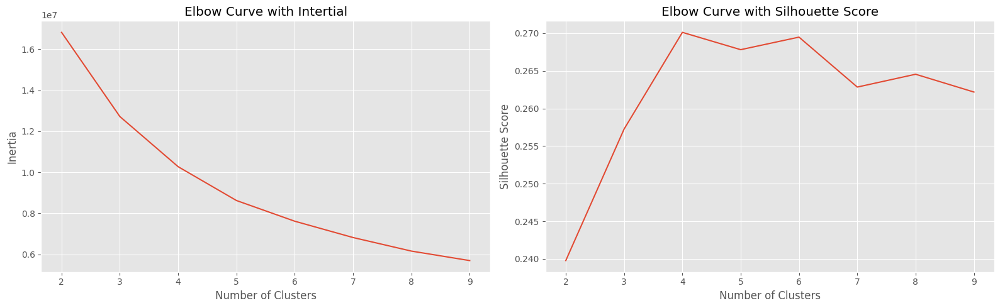

In [64]:
k_values = range(2, 10)

inertia = []
sil_scores = []
for k in tqdm(k_values):
    temp_kmeans = KMeans(n_clusters=k, random_state=42)
    temp_labels = temp_kmeans.fit_predict(X_kmeans_tsne)
    score = silhouette_score(X_kmeans_tsne, temp_labels)
    inertia.append(temp_kmeans.inertia_)
    sil_scores.append(score)

fig, axs = plt.subplots(1, 2, figsize=(16, 5))

sns.lineplot(x=k_values, y=inertia, ax=axs[0], markers='o')
axs[0].set_xlabel('Number of Clusters')
axs[0].set_ylabel('Inertia')
axs[0].set_title('Elbow Curve with Intertial')

sns.lineplot(x=k_values, y=sil_scores, ax=axs[1], markers='o')
axs[1].set_xlabel('Number of Clusters')
axs[1].set_ylabel('Silhouette Score')
axs[1].set_title('Elbow Curve with Silhouette Score')

axs[0].grid(True)
axs[1].grid(True)

plt.tight_layout()
plt.show()

#### 1.2.5 Training K-means With the Best Clustering Number:

In [65]:
kmeans_tsne = KMeans(n_clusters=4, random_state=42)
kmeans_tsne_labels = kmeans_tsne.fit_predict(X_kmeans_tsne)

df_kmeans_tsne = sampled_df_kmeans_tsne.copy()
df_kmeans_tsne['label'] = kmeans_tsne_labels.astype(str)

#### 1.2.6 Cluster Overlays on t-SNE:

##### 1.2.6.1 Three Dimentional Graph:

In [66]:
# --- DataFrame with t-SNE components and cluster labels ---
df_kmeans_tsne_3d = pd.DataFrame(X_kmeans_tsne[:, :3], columns=['TSNE1', 'TSNE2', 'TSNE3'])
df_kmeans_tsne_3d['Cluster'] = kmeans_tsne_labels.astype(str)

# --- Create base 3D scatter plot ---
fig = px.scatter_3d(df_kmeans_tsne_3d, x='TSNE1', y='TSNE2', z='TSNE3',
                    color='Cluster',
                    color_discrete_sequence=px.colors.qualitative.Vivid,
                    opacity=0.8)

# --- Get t-SNE-transformed centroids ---
centroids_kmeans_tsne_3d = kmeans_tsne.cluster_centers_

# --- Add centroids with standout styling ---
# fig.add_trace(go.Scatter3d(
#     x=centroids_tsne[:, 0],
#     y=centroids_tsne[:, 1],
#     z=centroids_tsne[:, 2],
#     mode='markers+text',
#     marker=dict(
#         size=14,
#         color='yellow',
#         symbol='diamond',
#         line=dict(color='black', width=2)
#     ),
#     text=[f'Centroid {i}' for i in range(len(centroids_tsne))],
#     textposition='top center',
#     name='Centroids'
# ))

# --- Update layout ---
fig.update_layout(title='3D t-SNE with KMeans Clustering and Centroids',
                  scene=dict(
                      xaxis_title='t-SNE Component 1',
                      yaxis_title='t-SNE Component 2',
                      zaxis_title='t-SNE Component 3'),
                  margin=dict(l=0, r=0, b=0, t=40))

fig.show()

##### 1.2.6.2 Two Dimentional Graph:

In [67]:
# --- Create DataFrame with t-SNE components and cluster labels ---
df_tsne_kmeans_2d = pd.DataFrame(X_kmeans_tsne[:, :2], columns=['TSNE1', 'TSNE2'])
df_tsne_kmeans_2d['Cluster'] = kmeans_tsne_labels.astype(str)

# --- Create 2D scatter plot ---
fig = px.scatter(df_tsne_kmeans_2d, x='TSNE1', y='TSNE2',
                 color='Cluster',
                 color_discrete_sequence=px.colors.qualitative.Vivid,
                 opacity=0.8)

# --- Get 2D centroids from KMeans ---
centroids_kmeans_tsne_2d = kmeans_tsne.cluster_centers_

# --- Add centroids to plot ---
fig.add_trace(go.Scatter(
    x=centroids_kmeans_tsne_2d[:, 0],
    y=centroids_kmeans_tsne_2d[:, 1],
    mode='markers+text',
    marker=dict(
        size=14,
        color='yellow',
        symbol='diamond',
        line=dict(color='black', width=2)
    ),
    text=[f'Centroid {i}' for i in range(len(centroids_kmeans_tsne_2d))],
    textposition='top center',
    name='Centroids'
))

# --- Update layout ---
fig.update_layout(title='2D t-SNE with KMeans Clustering and Centroids',
                  xaxis_title='t-SNE Component 1',
                  yaxis_title='t-SNE Component 2',
                  margin=dict(l=0, r=0, b=0, t=40))

fig.show()


#### 1.2.7 Statistics About The Clusters:

In [68]:
for col in df_kmeans_tsne.columns.drop('label'):
    display(df_kmeans_tsne.groupby(by='label', as_index=False)[col].describe().rename(columns={'label': col}))

,payment_by_boleto_proportion,count,mean,std,min,25%,50%,75%,max
0,0,12118.0,0.008582,0.092246,0.0,0.0,0.0,0.0,1.0
1,1,12395.0,0.327067,0.469161,0.0,0.0,0.0,1.0,1.0
2,2,11507.0,0.000000,0.000000,0.0,0.0,0.0,0.0,0.0
3,3,13312.0,0.425931,0.494502,0.0,0.0,0.0,1.0,1.0


,payment_by_credit_card_proportion,count,mean,std,min,25%,50%,75%,max
0,0,12118.0,0.987849,0.106878,0.0,1.0,1.0,1.0,1.0
1,1,12395.0,0.668536,0.468417,0.0,0.0,1.0,1.0,1.0
2,2,11507.0,0.982423,0.125284,0.0,1.0,1.0,1.0,1.0
3,3,13312.0,0.436488,0.480218,0.0,0.0,0.0,1.0,1.0


,payment_by_debit_card_proportion,count,mean,std,min,25%,50%,75%,max
0,0,12118.0,0.001155,0.033972,0.0,0.0,0.0,0.0,1.0
1,1,12395.0,0.000000,0.000000,0.0,0.0,0.0,0.0,0.0
2,2,11507.0,0.000000,0.000000,0.0,0.0,0.0,0.0,0.0
3,3,13312.0,0.057767,0.233312,0.0,0.0,0.0,0.0,1.0


,payment_by_voucher_proportion,count,mean,std,min,25%,50%,75%,max
0,0,12118.0,0.002414,0.042737,0.0,0.0,0.0,0.0,1.0
1,1,12395.0,0.004397,0.046683,0.0,0.0,0.0,0.0,0.5
2,2,11507.0,0.017577,0.125284,0.0,0.0,0.0,0.0,1.0
3,3,13312.0,0.079813,0.240984,0.0,0.0,0.0,0.0,1.0


,min_payment_value,count,mean,std,min,25%,50%,75%,max
0,0,12118.0,272.738005,350.475665,0.24,103.7050,168.200,292.2600,7274.88
1,1,12395.0,93.913737,61.737358,0.01,49.5950,76.950,122.7800,573.18
2,2,11507.0,98.403902,70.979766,0.05,47.4400,77.480,128.9800,629.27
3,3,13312.0,159.059624,163.549127,0.00,59.8625,111.995,197.9675,2234.66


,max_payment_value,count,mean,std,min,25%,50%,75%,max
0,0,12118.0,274.864624,354.621378,14.62,104.3700,168.53,294.7075,7274.88
1,1,12395.0,94.263286,61.455685,10.47,50.0200,77.11,122.8750,573.18
2,2,11507.0,99.029534,71.085909,10.34,48.0000,77.78,129.5300,629.27
3,3,13312.0,164.402457,162.980438,4.68,65.0975,116.36,201.1525,2234.66


,avg_payment_value,count,mean,std,min,25%,50%,75%,max
0,0,12118.0,273.792510,351.519887,7.681905,104.1900,168.360,293.4400,7274.88
1,1,12395.0,94.088511,61.560392,9.020000,49.8200,76.980,122.8250,573.18
2,2,11507.0,98.709387,70.902220,7.240000,47.7100,77.570,129.2050,629.27
3,3,13312.0,161.681286,162.478373,1.737500,63.0275,114.025,198.7625,2234.66


,total_payment_value,count,mean,std,min,25%,50%,75%,max
0,0,12118.0,276.146341,357.617333,14.62,104.700,168.77,295.83,7274.88
1,1,12395.0,94.492858,61.602800,11.62,50.230,77.47,123.01,583.15
2,2,11507.0,99.623900,72.286113,10.89,48.190,78.18,130.69,818.40
3,3,13312.0,167.983166,164.511565,9.59,67.815,119.86,204.51,2234.66


,min_payment_installments,count,mean,std,min,25%,50%,75%,max
0,0,12118.0,6.225532,2.849454,1.0,4.0,6.0,8.0,24.0
1,1,12395.0,1.270593,0.500640,0.0,1.0,1.0,2.0,6.0
2,2,11507.0,2.192578,1.280944,1.0,1.0,2.0,3.0,8.0
3,3,13312.0,2.008714,2.044744,1.0,1.0,1.0,2.0,24.0


,max_payment_installments,count,mean,std,min,25%,50%,75%,max
0,0,12118.0,6.241707,2.843255,1.0,4.0,6.0,8.0,24.0
1,1,12395.0,1.271803,0.501514,0.0,1.0,1.0,2.0,6.0
2,2,11507.0,2.196924,1.282928,1.0,1.0,2.0,3.0,8.0
3,3,13312.0,2.102614,2.142575,1.0,1.0,1.0,2.0,24.0


,avg_payment_installments,count,mean,std,min,25%,50%,75%,max
0,0,12118.0,6.233496,2.841768,1.0,4.0,6.0,8.0,24.0
1,1,12395.0,1.271198,0.500695,0.0,1.0,1.0,2.0,6.0
2,2,11507.0,2.194579,1.280797,1.0,1.0,2.0,3.0,8.0
3,3,13312.0,2.054213,2.058159,1.0,1.0,1.0,2.0,24.0


,total_payment_installments,count,mean,std,min,25%,50%,75%,max
0,0,12118.0,6.267041,2.870393,1.0,4.0,6.0,8.0,24.0
1,1,12395.0,1.283501,0.511429,0.0,1.0,1.0,2.0,6.0
2,2,11507.0,2.211784,1.288306,1.0,1.0,2.0,3.0,10.0
3,3,13312.0,2.231746,2.236623,1.0,1.0,1.0,3.0,29.0


,min_product_volume,count,mean,std,min,25%,50%,75%,max
0,0,12118.0,21117.644661,31453.373397,352.0,3800.0,9600.0,27000.0,296208.0
1,1,12395.0,9750.517724,11152.060546,168.0,2520.0,5040.0,13200.0,87500.0
2,2,11507.0,9341.536543,11348.860084,352.0,2378.0,4732.0,12000.0,101528.0
3,3,13312.0,19808.590999,28199.169228,352.0,2904.0,7828.0,23625.0,262080.0


,max_product_volume,count,mean,std,min,25%,50%,75%,max
0,0,12118.0,21874.262254,31878.156460,352.0,3960.0,10500.0,27345.00,296208.0
1,1,12395.0,9750.517724,11152.060546,168.0,2520.0,5040.0,13200.00,87500.0
2,2,11507.0,9341.536543,11348.860084,352.0,2378.0,4732.0,12000.00,101528.0
3,3,13312.0,20207.796754,28468.120906,352.0,2992.0,8000.0,23835.75,262080.0


,avg_product_volume,count,mean,std,min,25%,50%,75%,max
0,0,12118.0,21483.294022,31508.403504,352.0,3960.0,10240.0,27000.0,296208.0
1,1,12395.0,9750.517724,11152.060546,168.0,2520.0,5040.0,13200.0,87500.0
2,2,11507.0,9341.536543,11348.860084,352.0,2378.0,4732.0,12000.0,101528.0
3,3,13312.0,19993.912008,28253.568078,352.0,2964.0,8000.0,23625.0,262080.0


,total_product_volume,count,mean,std,min,25%,50%,75%,max
0,0,12118.0,24248.200941,37547.530848,352.0,4256.0,11656.0,30855.50,816480.0
1,1,12395.0,10097.016635,11715.027070,168.0,2560.0,5168.0,13824.00,124080.0
2,2,11507.0,9877.923872,12100.158191,352.0,2420.0,4864.0,12600.00,111456.0
3,3,13312.0,24817.093629,41112.638004,352.0,3328.0,8736.0,29624.25,1076544.0


,min_product_weight,count,mean,std,min,25%,50%,75%,max
0,0,12118.0,3112.892061,4873.370984,0.0,450.0,1175.0,3400.0,30000.0
1,1,12395.0,1079.493624,1583.460470,2.0,250.0,533.0,1250.0,16283.0
2,2,11507.0,1112.532980,1690.642636,2.0,233.0,500.0,1200.0,13350.0
3,3,13312.0,3008.642123,4804.187359,50.0,300.0,825.0,2950.0,40425.0


,max_product_weight,count,mean,std,min,25%,50%,75%,max
0,0,12118.0,3218.809705,4927.721593,0.0,471.0,1250.0,3700.00,30000.0
1,1,12395.0,1079.493624,1583.460470,2.0,250.0,533.0,1250.00,16283.0
2,2,11507.0,1112.532980,1690.642636,2.0,233.0,500.0,1200.00,13350.0
3,3,13312.0,3072.909326,4843.771453,50.0,300.0,850.0,3042.75,40425.0


,avg_product_weight,count,mean,std,min,25%,50%,75%,max
0,0,12118.0,3163.407983,4879.283614,0.0,460.0,1200.0,3571.5,30000.0
1,1,12395.0,1079.493624,1583.460470,2.0,250.0,533.0,1250.0,16283.0
2,2,11507.0,1112.532980,1690.642636,2.0,233.0,500.0,1200.0,13350.0
3,3,13312.0,3038.846491,4812.177658,50.0,300.0,850.0,3000.0,40425.0


,total_product_weight,count,mean,std,min,25%,50%,75%,max
0,0,12118.0,3497.271249,5593.930462,0.0,500.0,1383.0,4200.0,112200.0
1,1,12395.0,1125.443281,1708.239162,2.0,250.0,550.0,1275.0,22950.0
2,2,11507.0,1168.772921,1774.222382,2.0,250.0,500.0,1250.0,17750.0
3,3,13312.0,3717.095098,6788.872727,50.0,350.0,1000.0,3800.0,184400.0


,#_of_distinct_bought_products,count,mean,std,min,25%,50%,75%,max
0,0,12118.0,1.056610,0.280470,1.0,1.0,1.0,1.0,7.0
1,1,12395.0,1.000000,0.000000,1.0,1.0,1.0,1.0,1.0
2,2,11507.0,1.000000,0.000000,1.0,1.0,1.0,1.0,1.0
3,3,13312.0,1.090144,0.336789,1.0,1.0,1.0,1.0,6.0


,min_freight_value,count,mean,std,min,25%,50%,75%,max
0,0,12118.0,26.039427,24.451779,0.0,15.01,18.59,27.4175,409.68
1,1,12395.0,15.683806,4.867838,0.0,12.79,15.23,18.2300,56.61
2,2,11507.0,15.965522,7.801806,0.0,10.95,15.10,18.2300,68.40
3,3,13312.0,22.163782,16.503607,0.0,13.82,17.26,23.8400,209.63


,max_freight_value,count,mean,std,min,25%,50%,75%,max
0,0,12118.0,26.757467,24.474902,0.0,15.23,18.99,28.0875,409.68
1,1,12395.0,15.683806,4.867838,0.0,12.79,15.23,18.2300,56.61
2,2,11507.0,15.965522,7.801806,0.0,10.95,15.10,18.2300,68.40
3,3,13312.0,22.718966,16.517405,0.0,14.11,17.66,24.8400,209.63


,avg_freight_value,count,mean,std,min,25%,50%,75%,max
0,0,12118.0,26.395232,24.317772,0.0,15.11,18.74,27.55,409.68
1,1,12395.0,15.683806,4.867838,0.0,12.79,15.23,18.23,56.61
2,2,11507.0,15.965522,7.801806,0.0,10.95,15.10,18.23,68.40
3,3,13312.0,22.446844,16.388896,0.0,14.10,17.60,24.09,209.63


,total_freight_value,count,mean,std,min,25%,50%,75%,max
0,0,12118.0,29.999233,32.786753,0.0,15.830,20.40,34.1775,1794.96
1,1,12395.0,16.247938,6.237761,0.0,12.920,15.33,18.2700,108.36
2,2,11507.0,16.931295,9.195002,0.0,11.595,15.23,18.8750,100.98
3,3,13312.0,27.568972,24.686195,0.0,15.100,19.03,32.9225,502.98


,min_review_score,count,mean,std,min,25%,50%,75%,max
0,0,12118.0,4.511254,1.020770,1.0,4.102996,5.0,5.0,5.0
1,1,12395.0,4.998484,0.038719,4.0,5.000000,5.0,5.0,5.0
2,2,11507.0,4.054622,0.788496,1.0,4.000000,4.0,5.0,5.0
3,3,13312.0,2.929917,1.663598,1.0,1.000000,3.0,5.0,5.0


,max_review_score,count,mean,std,min,25%,50%,75%,max
0,0,12118.0,4.517227,1.015567,1.0,4.107173,5.0,5.0,5.0
1,1,12395.0,4.998484,0.038704,4.0,5.000000,5.0,5.0,5.0
2,2,11507.0,4.059641,0.780216,2.0,4.000000,4.0,5.0,5.0
3,3,13312.0,2.935212,1.663701,1.0,1.000000,3.0,5.0,5.0


,avg_review_score,count,mean,std,min,25%,50%,75%,max
0,0,12118.0,4.514268,1.016565,1.0,4.105087,5.0,5.0,5.0
1,1,12395.0,4.998484,0.038711,4.0,5.000000,5.0,5.0,5.0
2,2,11507.0,4.057117,0.781900,2.0,4.000000,4.0,5.0,5.0
3,3,13312.0,2.932564,1.662635,1.0,1.000000,3.0,5.0,5.0


,total_review_score,count,mean,std,min,25%,50%,75%,max
0,0,12118.0,4.566316,1.129411,1.0,4.12762,5.0,5.0,13.0
1,1,12395.0,5.000343,0.094003,4.0,5.00000,5.0,5.0,10.0
2,2,11507.0,4.063524,0.785344,2.0,4.00000,4.0,5.0,10.0
3,3,13312.0,2.956425,1.709622,1.0,1.00000,3.0,5.0,15.0


,#_of_distinct_sellers,count,mean,std,min,25%,50%,75%,max
0,0,12118.0,1.050091,0.233491,1.0,1.0,1.0,1.0,5.0
1,1,12395.0,1.000000,0.000000,1.0,1.0,1.0,1.0,1.0
2,2,11507.0,1.000000,0.000000,1.0,1.0,1.0,1.0,1.0
3,3,13312.0,1.006235,0.078718,1.0,1.0,1.0,1.0,2.0


## 2. Model Variant (with **DBSCAN**)

### 2.1 Sampling (%50):

In [69]:
sampled_df_dbscan_tsne = df_dbscan.sample(frac=0.5, random_state=42)

### 2.2 Scaling:

In [70]:
scaler_dbscan_tsne = StandardScaler()
X_dbscan_tsne_scaled = scaler_dbscan_tsne.fit_transform(sampled_df_dbscan_tsne)

### 2.3 Dimension Reduction via **t-SNE**:

In [71]:
tsne_dbscan = TSNE(n_components=3, perplexity=30, learning_rate=200, random_state=42)
X_dbscan_tsne = tsne_dbscan.fit_transform(X_dbscan_tsne_scaled)

In [72]:
min_samples = 6
k = min_samples

### 2.4 Tunning Parameters For **DBSCAN**:

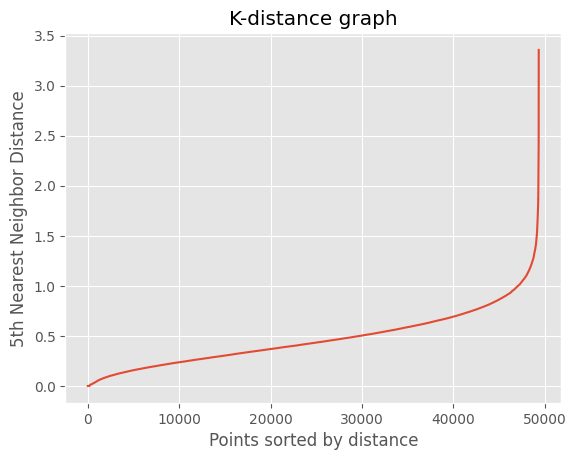

In [73]:
neighbors = NearestNeighbors(n_neighbors=5)
neighbors_fit = neighbors.fit(X_dbscan_tsne)
distances, indices = neighbors_fit.kneighbors(X_dbscan_tsne)

# Sort distances for the k-th nearest neighbor
distances = np.sort(distances[:, 4])  # 4 because n_neighbors=5
plt.plot(distances)
plt.ylabel("5th Nearest Neighbor Distance")
plt.xlabel("Points sorted by distance")
plt.title("K-distance graph")
plt.show()

In [74]:
eps = 0.6

### 2.5 Training **DBSCAN** With The Best Parameters:

In [75]:
# Apply DBSCAN on the PCA-transformed data
dbscan_tsne = DBSCAN(eps=eps, min_samples=min_samples)
labels_dbscan_tsne = dbscan_tsne.fit_predict(X_dbscan_tsne)

sampled_df_dbscan_tsne['label'] = labels_dbscan_tsne.astype(str)

### 2.6 Calculating ***Silhouette Score*** For The Model:

In [76]:
# Remove noise
mask = labels_dbscan_tsne != -1
X_valid = X_dbscan_tsne[mask]
labels_valid = labels_dbscan_tsne[mask]

if len(set(labels_valid)) > 1:
    sil_score = silhouette_score(X_valid, labels_valid)
    print(f"Silhouette Score (excluding noise): {sil_score:.4f}")
else:
    print("Too few clusters for silhouette score.")

Silhouette Score (excluding noise): 0.5123


### 2.7 Cluster Overlays on t-SNE:

##### 2.7.1 Three Dimentional Graph:

In [77]:
# DataFrame with t-SNE components and cluster labels
df_dbscan_tsne_3d = pd.DataFrame(X_dbscan_tsne[:, 0:3], columns=['tSNE1', 'tSNE2', 'tSNE3'])
df_dbscan_tsne_3d['Cluster'] = labels_dbscan_tsne.astype(str)

# Create 3D scatter plot for t-SNE components
fig = px.scatter_3d(df_dbscan_tsne_3d, x='tSNE1', y='tSNE2', z='tSNE3',
                    color='Cluster',
                    color_discrete_sequence=px.colors.qualitative.Vivid,
                    opacity=0.8)

# Update layout
fig.update_layout(title='Interactive 3D t-SNE with DBSCAN Clustering',
                  scene=dict(
                      xaxis_title='t-SNE Component 1',
                      yaxis_title='t-SNE Component 2',
                      zaxis_title='t-SNE Component 3'),
                  margin=dict(l=0, r=0, b=0, t=40))

fig.show()

##### 2.7.2 Two Dimentional Graph:

In [78]:
# DataFrame with 2D t-SNE components and cluster labels
df_dbscan_tsne_2d = pd.DataFrame(X_dbscan_tsne[:, 0:2], columns=['tSNE1', 'tSNE2'])
df_dbscan_tsne_2d['Cluster'] = labels_dbscan_tsne.astype(str)

# Create 2D scatter plot for t-SNE components
fig = px.scatter(df_dbscan_tsne_2d, x='tSNE1', y='tSNE2',
                 color='Cluster',
                 color_discrete_sequence=px.colors.qualitative.Vivid,
                 opacity=0.8)

# Update layout
fig.update_layout(title='Interactive 2D t-SNE with DBSCAN Clustering',
                  xaxis_title='t-SNE Component 1',
                  yaxis_title='t-SNE Component 2',
                  margin=dict(l=0, r=0, b=0, t=40))

fig.show()

### 2.8 Statistics About The Clusters:

In [79]:
for col in sampled_df_dbscan_tsne.columns.drop('label'):
    display(sampled_df_dbscan_tsne.groupby(by='label', as_index=False)[col].describe().rename(columns={'label': col}))

,payment_by_boleto_proportion,count,mean,std,min,25%,50%,75%,max
0,-1,10376.0,0.188512,0.391139,0.0,0.0,0.0,0.0,1.0
1,0,9.0,0.000000,0.000000,0.0,0.0,0.0,0.0,0.0
2,1,92.0,0.000000,0.000000,0.0,0.0,0.0,0.0,0.0
3,10,11.0,0.000000,0.000000,0.0,0.0,0.0,0.0,0.0
4,100,50.0,1.000000,0.000000,1.0,1.0,1.0,1.0,1.0
...,...,...,...,...,...,...,...,...,...
2254,995,16.0,0.000000,0.000000,0.0,0.0,0.0,0.0,0.0
2255,996,16.0,0.000000,0.000000,0.0,0.0,0.0,0.0,0.0
2256,997,31.0,0.000000,0.000000,0.0,0.0,0.0,0.0,0.0
2257,998,18.0,0.000000,0.000000,0.0,0.0,0.0,0.0,0.0


,payment_by_credit_card_proportion,count,mean,std,min,25%,50%,75%,max
0,-1,10376.0,0.778522,0.409630,0.0,1.0,1.0,1.0,1.0
1,0,9.0,0.944444,0.166667,0.5,1.0,1.0,1.0,1.0
2,1,92.0,1.000000,0.000000,1.0,1.0,1.0,1.0,1.0
3,10,11.0,1.000000,0.000000,1.0,1.0,1.0,1.0,1.0
4,100,50.0,0.000000,0.000000,0.0,0.0,0.0,0.0,0.0
...,...,...,...,...,...,...,...,...,...
2254,995,16.0,1.000000,0.000000,1.0,1.0,1.0,1.0,1.0
2255,996,16.0,1.000000,0.000000,1.0,1.0,1.0,1.0,1.0
2256,997,31.0,1.000000,0.000000,1.0,1.0,1.0,1.0,1.0
2257,998,18.0,1.000000,0.000000,1.0,1.0,1.0,1.0,1.0


,payment_by_debit_card_proportion,count,mean,std,min,25%,50%,75%,max
0,-1,10376.0,0.013011,0.113326,0.0,0.0,0.0,0.0,1.0
1,0,9.0,0.000000,0.000000,0.0,0.0,0.0,0.0,0.0
2,1,92.0,0.000000,0.000000,0.0,0.0,0.0,0.0,0.0
3,10,11.0,0.000000,0.000000,0.0,0.0,0.0,0.0,0.0
4,100,50.0,0.000000,0.000000,0.0,0.0,0.0,0.0,0.0
...,...,...,...,...,...,...,...,...,...
2254,995,16.0,0.000000,0.000000,0.0,0.0,0.0,0.0,0.0
2255,996,16.0,0.000000,0.000000,0.0,0.0,0.0,0.0,0.0
2256,997,31.0,0.000000,0.000000,0.0,0.0,0.0,0.0,0.0
2257,998,18.0,0.000000,0.000000,0.0,0.0,0.0,0.0,0.0


,payment_by_voucher_proportion,count,mean,std,min,25%,50%,75%,max
0,-1,10376.0,0.019955,0.122121,0.0,0.0,0.0,0.0,1.0
1,0,9.0,0.055556,0.166667,0.0,0.0,0.0,0.0,0.5
2,1,92.0,0.000000,0.000000,0.0,0.0,0.0,0.0,0.0
3,10,11.0,0.000000,0.000000,0.0,0.0,0.0,0.0,0.0
4,100,50.0,0.000000,0.000000,0.0,0.0,0.0,0.0,0.0
...,...,...,...,...,...,...,...,...,...
2254,995,16.0,0.000000,0.000000,0.0,0.0,0.0,0.0,0.0
2255,996,16.0,0.000000,0.000000,0.0,0.0,0.0,0.0,0.0
2256,997,31.0,0.000000,0.000000,0.0,0.0,0.0,0.0,0.0
2257,998,18.0,0.000000,0.000000,0.0,0.0,0.0,0.0,0.0


,min_payment_value,count,mean,std,min,25%,50%,75%,max
0,-1,10376.0,183.971195,213.504481,0.00,72.5350,122.875,208.6175,2844.96
1,0,9.0,195.007778,94.070585,21.19,149.3200,209.080,246.8200,342.88
2,1,92.0,124.061413,16.970244,101.39,110.9925,119.495,136.1600,173.31
3,10,11.0,142.093636,44.210591,73.34,110.0550,147.650,179.3550,195.00
4,100,50.0,75.272400,20.716001,51.78,57.6300,67.470,87.6125,123.26
...,...,...,...,...,...,...,...,...,...
2254,995,16.0,328.927500,64.769503,214.10,306.9600,331.045,349.6900,505.27
2255,996,16.0,120.697500,50.346688,64.50,88.2300,112.835,128.2225,261.96
2256,997,31.0,72.789677,12.521362,60.10,62.2150,66.500,84.5950,97.83
2257,998,18.0,334.721111,36.853532,286.64,310.7800,318.140,351.2300,414.20


,max_payment_value,count,mean,std,min,25%,50%,75%,max
0,-1,10376.0,187.753497,221.781917,5.14,74.6475,124.700,210.9925,3899.00
1,0,9.0,212.152222,69.207240,106.78,175.4900,209.080,246.8200,342.88
2,1,92.0,124.061413,16.970244,101.39,110.9925,119.495,136.1600,173.31
3,10,11.0,142.093636,44.210591,73.34,110.0550,147.650,179.3550,195.00
4,100,50.0,75.272400,20.716001,51.78,57.6300,67.470,87.6125,123.26
...,...,...,...,...,...,...,...,...,...
2254,995,16.0,328.927500,64.769503,214.10,306.9600,331.045,349.6900,505.27
2255,996,16.0,120.697500,50.346688,64.50,88.2300,112.835,128.2225,261.96
2256,997,31.0,72.789677,12.521362,60.10,62.2150,66.500,84.5950,97.83
2257,998,18.0,334.721111,36.853532,286.64,310.7800,318.140,351.2300,414.20


,avg_payment_value,count,mean,std,min,25%,50%,75%,max
0,-1,10376.0,185.842104,215.630554,4.903333,73.7550,123.530,209.6175,2844.96
1,0,9.0,203.580000,78.473636,98.340000,149.3200,209.080,246.8200,342.88
2,1,92.0,124.061413,16.970244,101.390000,110.9925,119.495,136.1600,173.31
3,10,11.0,142.093636,44.210591,73.340000,110.0550,147.650,179.3550,195.00
4,100,50.0,75.272400,20.716001,51.780000,57.6300,67.470,87.6125,123.26
...,...,...,...,...,...,...,...,...,...
2254,995,16.0,328.927500,64.769503,214.100000,306.9600,331.045,349.6900,505.27
2255,996,16.0,120.697500,50.346688,64.500000,88.2300,112.835,128.2225,261.96
2256,997,31.0,72.789677,12.521362,60.100000,62.2150,66.500,84.5950,97.83
2257,998,18.0,334.721111,36.853532,286.640000,310.7800,318.140,351.2300,414.20


,total_payment_value,count,mean,std,min,25%,50%,75%,max
0,-1,10376.0,190.379701,227.699493,14.06,75.5800,126.475,213.4700,4194.76
1,0,9.0,214.506667,68.156545,106.78,183.0000,209.080,246.8200,342.88
2,1,92.0,124.061413,16.970244,101.39,110.9925,119.495,136.1600,173.31
3,10,11.0,142.093636,44.210591,73.34,110.0550,147.650,179.3550,195.00
4,100,50.0,75.272400,20.716001,51.78,57.6300,67.470,87.6125,123.26
...,...,...,...,...,...,...,...,...,...
2254,995,16.0,328.927500,64.769503,214.10,306.9600,331.045,349.6900,505.27
2255,996,16.0,120.697500,50.346688,64.50,88.2300,112.835,128.2225,261.96
2256,997,31.0,72.789677,12.521362,60.10,62.2150,66.500,84.5950,97.83
2257,998,18.0,334.721111,36.853532,286.64,310.7800,318.140,351.2300,414.20


,min_payment_installments,count,mean,std,min,25%,50%,75%,max
0,-1,10376.0,3.018504,2.723613,1.0,1.0,2.0,4.0,20.0
1,0,9.0,1.111111,0.333333,1.0,1.0,1.0,1.0,2.0
2,1,92.0,10.000000,0.000000,10.0,10.0,10.0,10.0,10.0
3,10,11.0,3.000000,0.000000,3.0,3.0,3.0,3.0,3.0
4,100,50.0,1.000000,0.000000,1.0,1.0,1.0,1.0,1.0
...,...,...,...,...,...,...,...,...,...
2254,995,16.0,9.250000,1.390444,7.0,8.0,10.0,10.0,12.0
2255,996,16.0,1.000000,0.000000,1.0,1.0,1.0,1.0,1.0
2256,997,31.0,6.000000,0.000000,6.0,6.0,6.0,6.0,6.0
2257,998,18.0,3.000000,0.000000,3.0,3.0,3.0,3.0,3.0


,max_payment_installments,count,mean,std,min,25%,50%,75%,max
0,-1,10376.0,3.068524,2.750619,1.0,1.0,2.0,4.0,24.0
1,0,9.0,1.111111,0.333333,1.0,1.0,1.0,1.0,2.0
2,1,92.0,10.000000,0.000000,10.0,10.0,10.0,10.0,10.0
3,10,11.0,3.000000,0.000000,3.0,3.0,3.0,3.0,3.0
4,100,50.0,1.000000,0.000000,1.0,1.0,1.0,1.0,1.0
...,...,...,...,...,...,...,...,...,...
2254,995,16.0,9.250000,1.390444,7.0,8.0,10.0,10.0,12.0
2255,996,16.0,1.000000,0.000000,1.0,1.0,1.0,1.0,1.0
2256,997,31.0,6.000000,0.000000,6.0,6.0,6.0,6.0,6.0
2257,998,18.0,3.000000,0.000000,3.0,3.0,3.0,3.0,3.0


,avg_payment_installments,count,mean,std,min,25%,50%,75%,max
0,-1,10376.0,3.042454,2.721560,1.0,1.0,2.0,4.0,20.0
1,0,9.0,1.111111,0.333333,1.0,1.0,1.0,1.0,2.0
2,1,92.0,10.000000,0.000000,10.0,10.0,10.0,10.0,10.0
3,10,11.0,3.000000,0.000000,3.0,3.0,3.0,3.0,3.0
4,100,50.0,1.000000,0.000000,1.0,1.0,1.0,1.0,1.0
...,...,...,...,...,...,...,...,...,...
2254,995,16.0,9.250000,1.390444,7.0,8.0,10.0,10.0,12.0
2255,996,16.0,1.000000,0.000000,1.0,1.0,1.0,1.0,1.0
2256,997,31.0,6.000000,0.000000,6.0,6.0,6.0,6.0,6.0
2257,998,18.0,3.000000,0.000000,3.0,3.0,3.0,3.0,3.0


,total_payment_installments,count,mean,std,min,25%,50%,75%,max
0,-1,10376.0,3.126542,2.800978,1.0,1.0,2.0,4.0,29.0
1,0,9.0,1.222222,0.440959,1.0,1.0,1.0,1.0,2.0
2,1,92.0,10.000000,0.000000,10.0,10.0,10.0,10.0,10.0
3,10,11.0,3.000000,0.000000,3.0,3.0,3.0,3.0,3.0
4,100,50.0,1.000000,0.000000,1.0,1.0,1.0,1.0,1.0
...,...,...,...,...,...,...,...,...,...
2254,995,16.0,9.250000,1.390444,7.0,8.0,10.0,10.0,12.0
2255,996,16.0,1.000000,0.000000,1.0,1.0,1.0,1.0,1.0
2256,997,31.0,6.000000,0.000000,6.0,6.0,6.0,6.0,6.0
2257,998,18.0,3.000000,0.000000,3.0,3.0,3.0,3.0,3.0


,min_product_volume,count,mean,std,min,25%,50%,75%,max
0,-1,10376.0,18624.987567,24732.110798,352.0,4368.00,9375.0,23166.00,282750.0
1,0,9.0,52415.888889,8456.441368,37260.0,48048.00,51840.0,58240.00,66550.0
2,1,92.0,4323.141304,2562.683653,640.0,2424.00,3711.0,5778.00,11880.0
3,10,11.0,17564.000000,2292.540948,14664.0,16000.00,16650.0,18945.00,22000.0
4,100,50.0,2062.880000,1363.320057,352.0,727.50,1936.0,3024.50,5544.0
...,...,...,...,...,...,...,...,...,...
2254,995,16.0,131205.625000,13478.944923,113652.0,125378.00,125504.0,137137.75,163466.0
2255,996,16.0,6107.500000,5227.111006,1188.0,2923.00,4473.0,8565.75,20000.0
2256,997,31.0,9013.645161,1689.850833,6336.0,8000.00,8670.0,9725.00,12960.0
2257,998,18.0,3782.944444,2574.761519,561.0,2163.75,3017.0,4415.50,9200.0


,max_product_volume,count,mean,std,min,25%,50%,75%,max
0,-1,10376.0,19060.271492,25281.073528,352.0,4480.00,9600.0,23625.00,288000.0
1,0,9.0,52415.888889,8456.441368,37260.0,48048.00,51840.0,58240.00,66550.0
2,1,92.0,4323.141304,2562.683653,640.0,2424.00,3711.0,5778.00,11880.0
3,10,11.0,17564.000000,2292.540948,14664.0,16000.00,16650.0,18945.00,22000.0
4,100,50.0,2062.880000,1363.320057,352.0,727.50,1936.0,3024.50,5544.0
...,...,...,...,...,...,...,...,...,...
2254,995,16.0,131205.625000,13478.944923,113652.0,125378.00,125504.0,137137.75,163466.0
2255,996,16.0,6107.500000,5227.111006,1188.0,2923.00,4473.0,8565.75,20000.0
2256,997,31.0,9013.645161,1689.850833,6336.0,8000.00,8670.0,9725.00,12960.0
2257,998,18.0,3782.944444,2574.761519,561.0,2163.75,3017.0,4415.50,9200.0


,avg_product_volume,count,mean,std,min,25%,50%,75%,max
0,-1,10376.0,18839.413750,24873.853123,352.0,4414.50,9600.0,23625.00,282750.0
1,0,9.0,52415.888889,8456.441368,37260.0,48048.00,51840.0,58240.00,66550.0
2,1,92.0,4323.141304,2562.683653,640.0,2424.00,3711.0,5778.00,11880.0
3,10,11.0,17564.000000,2292.540948,14664.0,16000.00,16650.0,18945.00,22000.0
4,100,50.0,2062.880000,1363.320057,352.0,727.50,1936.0,3024.50,5544.0
...,...,...,...,...,...,...,...,...,...
2254,995,16.0,131205.625000,13478.944923,113652.0,125378.00,125504.0,137137.75,163466.0
2255,996,16.0,6107.500000,5227.111006,1188.0,2923.00,4473.0,8565.75,20000.0
2256,997,31.0,9013.645161,1689.850833,6336.0,8000.00,8670.0,9725.00,12960.0
2257,998,18.0,3782.944444,2574.761519,561.0,2163.75,3017.0,4415.50,9200.0


,total_product_volume,count,mean,std,min,25%,50%,75%,max
0,-1,10376.0,22287.802332,32728.818650,352.0,4800.00,10701.0,27000.00,816480.0
1,0,9.0,110591.777778,23868.744467,74520.0,96096.00,104976.0,119680.00,155520.0
2,1,92.0,4522.250000,2805.793452,640.0,2424.00,3960.0,5975.25,14400.0
3,10,11.0,17564.000000,2292.540948,14664.0,16000.00,16650.0,18945.00,22000.0
4,100,50.0,2199.520000,1498.065259,352.0,727.50,1976.0,3462.00,5632.0
...,...,...,...,...,...,...,...,...,...
2254,995,16.0,131205.625000,13478.944923,113652.0,125378.00,125504.0,137137.75,163466.0
2255,996,16.0,6107.500000,5227.111006,1188.0,2923.00,4473.0,8565.75,20000.0
2256,997,31.0,9013.645161,1689.850833,6336.0,8000.00,8670.0,9725.00,12960.0
2257,998,18.0,3782.944444,2574.761519,561.0,2163.75,3017.0,4415.50,9200.0


,min_product_weight,count,mean,std,min,25%,50%,75%,max
0,-1,10376.0,2753.636180,4181.188256,0.0,456.75,1110.0,2800.00,30000.0
1,0,9.0,9237.000000,1185.167077,6933.0,8800.00,9350.0,10000.00,10800.0
2,1,92.0,410.902174,225.820996,50.0,250.00,375.0,550.00,1400.0
3,10,11.0,4968.181818,304.362224,4500.0,4750.00,4950.0,5200.00,5500.0
4,100,50.0,238.400000,93.607954,50.0,150.00,250.0,274.75,450.0
...,...,...,...,...,...,...,...,...,...
2254,995,16.0,21050.000000,1575.648015,19050.0,19200.00,21500.0,22350.00,23100.0
2255,996,16.0,537.125000,360.800753,100.0,302.00,450.0,712.50,1383.0
2256,997,31.0,959.419355,293.038083,250.0,800.00,950.0,1075.00,1850.0
2257,998,18.0,657.722222,415.706175,215.0,412.00,450.0,838.00,1650.0


,max_product_weight,count,mean,std,min,25%,50%,75%,max
0,-1,10376.0,2823.187934,4250.884170,0.0,480.0,1150.0,2950.00,30000.0
1,0,9.0,9237.000000,1185.167077,6933.0,8800.0,9350.0,10000.00,10800.0
2,1,92.0,410.902174,225.820996,50.0,250.0,375.0,550.00,1400.0
3,10,11.0,4968.181818,304.362224,4500.0,4750.0,4950.0,5200.00,5500.0
4,100,50.0,238.400000,93.607954,50.0,150.0,250.0,274.75,450.0
...,...,...,...,...,...,...,...,...,...
2254,995,16.0,21050.000000,1575.648015,19050.0,19200.0,21500.0,22350.00,23100.0
2255,996,16.0,537.125000,360.800753,100.0,302.0,450.0,712.50,1383.0
2256,997,31.0,959.419355,293.038083,250.0,800.0,950.0,1075.00,1850.0
2257,998,18.0,657.722222,415.706175,215.0,412.0,450.0,838.00,1650.0


,avg_product_weight,count,mean,std,min,25%,50%,75%,max
0,-1,10376.0,2787.766891,4199.945024,0.0,475.0,1150.0,2900.00,30000.0
1,0,9.0,9237.000000,1185.167077,6933.0,8800.0,9350.0,10000.00,10800.0
2,1,92.0,410.902174,225.820996,50.0,250.0,375.0,550.00,1400.0
3,10,11.0,4968.181818,304.362224,4500.0,4750.0,4950.0,5200.00,5500.0
4,100,50.0,238.400000,93.607954,50.0,150.0,250.0,274.75,450.0
...,...,...,...,...,...,...,...,...,...
2254,995,16.0,21050.000000,1575.648015,19050.0,19200.0,21500.0,22350.00,23100.0
2255,996,16.0,537.125000,360.800753,100.0,302.0,450.0,712.50,1383.0
2256,997,31.0,959.419355,293.038083,250.0,800.0,950.0,1075.00,1850.0
2257,998,18.0,657.722222,415.706175,215.0,412.0,450.0,838.00,1650.0


,total_product_weight,count,mean,std,min,25%,50%,75%,max
0,-1,10376.0,3277.023901,5420.613707,0.0,500.0,1250.0,3407.00,112200.0
1,0,9.0,19244.333333,1724.061774,16100.0,18400.0,19500.0,20500.00,21600.0
2,1,92.0,427.630435,245.238826,50.0,250.0,387.5,560.25,1400.0
3,10,11.0,4968.181818,304.362224,4500.0,4750.0,4950.0,5200.00,5500.0
4,100,50.0,247.400000,98.275955,100.0,162.5,250.0,300.00,500.0
...,...,...,...,...,...,...,...,...,...
2254,995,16.0,21050.000000,1575.648015,19050.0,19200.0,21500.0,22350.00,23100.0
2255,996,16.0,537.125000,360.800753,100.0,302.0,450.0,712.50,1383.0
2256,997,31.0,959.419355,293.038083,250.0,800.0,950.0,1075.00,1850.0
2257,998,18.0,657.722222,415.706175,215.0,412.0,450.0,838.00,1650.0


,#_of_distinct_bought_products,count,mean,std,min,25%,50%,75%,max
0,-1,10376.0,1.034792,0.223108,1.0,1.0,1.0,1.0,7.0
1,0,9.0,1.000000,0.000000,1.0,1.0,1.0,1.0,1.0
2,1,92.0,1.000000,0.000000,1.0,1.0,1.0,1.0,1.0
3,10,11.0,1.000000,0.000000,1.0,1.0,1.0,1.0,1.0
4,100,50.0,1.000000,0.000000,1.0,1.0,1.0,1.0,1.0
...,...,...,...,...,...,...,...,...,...
2254,995,16.0,1.000000,0.000000,1.0,1.0,1.0,1.0,1.0
2255,996,16.0,1.000000,0.000000,1.0,1.0,1.0,1.0,1.0
2256,997,31.0,1.000000,0.000000,1.0,1.0,1.0,1.0,1.0
2257,998,18.0,1.000000,0.000000,1.0,1.0,1.0,1.0,1.0


,min_freight_value,count,mean,std,min,25%,50%,75%,max
0,-1,10376.0,22.217607,17.003068,0.00,13.8400,17.600,24.1800,299.16
1,0,9.0,20.416667,6.185780,7.39,16.6600,21.540,24.6400,28.00
2,1,92.0,14.953261,5.124272,0.00,11.9775,15.520,18.8750,24.63
3,10,11.0,18.558182,3.252967,12.15,17.4600,19.900,20.6300,22.24
4,100,50.0,8.069400,0.447909,7.39,7.7800,7.920,8.4175,9.23
...,...,...,...,...,...,...,...,...,...
2254,995,16.0,80.546875,10.952796,61.56,72.0275,81.725,88.0325,97.32
2255,996,16.0,53.745625,4.007255,50.00,50.8500,51.725,57.0525,62.53
2256,997,31.0,16.119355,1.595719,13.41,15.1100,15.700,17.4050,19.58
2257,998,18.0,15.428333,3.338974,10.25,13.3175,16.300,17.3475,22.90


,max_freight_value,count,mean,std,min,25%,50%,75%,max
0,-1,10376.0,22.647204,17.267201,0.00,14.1000,17.730,24.8700,299.16
1,0,9.0,20.416667,6.185780,7.39,16.6600,21.540,24.6400,28.00
2,1,92.0,14.953261,5.124272,0.00,11.9775,15.520,18.8750,24.63
3,10,11.0,18.558182,3.252967,12.15,17.4600,19.900,20.6300,22.24
4,100,50.0,8.069400,0.447909,7.39,7.7800,7.920,8.4175,9.23
...,...,...,...,...,...,...,...,...,...
2254,995,16.0,80.546875,10.952796,61.56,72.0275,81.725,88.0325,97.32
2255,996,16.0,53.745625,4.007255,50.00,50.8500,51.725,57.0525,62.53
2256,997,31.0,16.119355,1.595719,13.41,15.1100,15.700,17.4050,19.58
2257,998,18.0,15.428333,3.338974,10.25,13.3175,16.300,17.3475,22.90


,avg_freight_value,count,mean,std,min,25%,50%,75%,max
0,-1,10376.0,22.434293,16.990456,0.00,14.0775,17.645,24.5500,299.16
1,0,9.0,20.416667,6.185780,7.39,16.6600,21.540,24.6400,28.00
2,1,92.0,14.953261,5.124272,0.00,11.9775,15.520,18.8750,24.63
3,10,11.0,18.558182,3.252967,12.15,17.4600,19.900,20.6300,22.24
4,100,50.0,8.069400,0.447909,7.39,7.7800,7.920,8.4175,9.23
...,...,...,...,...,...,...,...,...,...
2254,995,16.0,80.546875,10.952796,61.56,72.0275,81.725,88.0325,97.32
2255,996,16.0,53.745625,4.007255,50.00,50.8500,51.725,57.0525,62.53
2256,997,31.0,16.119355,1.595719,13.41,15.1100,15.700,17.4050,19.58
2257,998,18.0,15.428333,3.338974,10.25,13.3175,16.300,17.3475,22.90


,total_freight_value,count,mean,std,min,25%,50%,75%,max
0,-1,10376.0,26.563786,29.537818,0.00,14.6175,18.530,28.8900,1794.96
1,0,9.0,43.118889,14.200226,14.78,33.3200,46.820,50.0800,61.71
2,1,92.0,15.234457,4.886913,0.00,12.1900,15.580,18.8750,24.63
3,10,11.0,18.558182,3.252967,12.15,17.4600,19.900,20.6300,22.24
4,100,50.0,8.530000,1.795553,7.39,7.7800,7.930,8.6775,15.56
...,...,...,...,...,...,...,...,...,...
2254,995,16.0,80.546875,10.952796,61.56,72.0275,81.725,88.0325,97.32
2255,996,16.0,53.745625,4.007255,50.00,50.8500,51.725,57.0525,62.53
2256,997,31.0,16.119355,1.595719,13.41,15.1100,15.700,17.4050,19.58
2257,998,18.0,15.428333,3.338974,10.25,13.3175,16.300,17.3475,22.90


,min_review_score,count,mean,std,min,25%,50%,75%,max
0,-1,10376.0,4.098555,1.316231,1.0,4.0,5.0,5.0,5.000000
1,0,9.0,4.567000,0.514443,4.0,4.0,5.0,5.0,5.000000
2,1,92.0,5.000000,0.000000,5.0,5.0,5.0,5.0,5.000000
3,10,11.0,5.000000,0.000000,5.0,5.0,5.0,5.0,5.000000
4,100,50.0,4.006180,0.024709,4.0,4.0,4.0,4.0,4.102996
...,...,...,...,...,...,...,...,...,...
2254,995,16.0,4.562500,0.727438,3.0,4.0,5.0,5.0,5.000000
2255,996,16.0,5.000000,0.000000,5.0,5.0,5.0,5.0,5.000000
2256,997,31.0,5.000000,0.000000,5.0,5.0,5.0,5.0,5.000000
2257,998,18.0,4.005722,0.024276,4.0,4.0,4.0,4.0,4.102996


,max_review_score,count,mean,std,min,25%,50%,75%,max
0,-1,10376.0,4.104957,1.311777,1.0,4.0,5.0,5.0,5.000000
1,0,9.0,4.567464,0.513974,4.0,4.0,5.0,5.0,5.000000
2,1,92.0,5.000000,0.000000,5.0,5.0,5.0,5.0,5.000000
3,10,11.0,5.000000,0.000000,5.0,5.0,5.0,5.0,5.000000
4,100,50.0,4.006430,0.025711,4.0,4.0,4.0,4.0,4.107173
...,...,...,...,...,...,...,...,...,...
2254,995,16.0,4.562500,0.727438,3.0,4.0,5.0,5.0,5.000000
2255,996,16.0,5.000000,0.000000,5.0,5.0,5.0,5.0,5.000000
2256,997,31.0,5.000000,0.000000,5.0,5.0,5.0,5.0,5.000000
2257,998,18.0,4.005954,0.025261,4.0,4.0,4.0,4.0,4.107173


,avg_review_score,count,mean,std,min,25%,50%,75%,max
0,-1,10376.0,4.101740,1.312440,1.0,4.0,5.0,5.0,5.000000
1,0,9.0,4.567232,0.514208,4.0,4.0,5.0,5.0,5.000000
2,1,92.0,5.000000,0.000000,5.0,5.0,5.0,5.0,5.000000
3,10,11.0,5.000000,0.000000,5.0,5.0,5.0,5.0,5.000000
4,100,50.0,4.006305,0.025210,4.0,4.0,4.0,4.0,4.105087
...,...,...,...,...,...,...,...,...,...
2254,995,16.0,4.562500,0.727438,3.0,4.0,5.0,5.0,5.000000
2255,996,16.0,5.000000,0.000000,5.0,5.0,5.0,5.0,5.000000
2256,997,31.0,5.000000,0.000000,5.0,5.0,5.0,5.0,5.000000
2257,998,18.0,4.005838,0.024769,4.0,4.0,4.0,4.0,4.105087


,total_review_score,count,mean,std,min,25%,50%,75%,max
0,-1,10376.0,4.124436,1.348234,1.0,4.0,5.0,5.0,15.00000
1,0,9.0,4.569736,0.511725,4.0,4.0,5.0,5.0,5.00000
2,1,92.0,5.000000,0.000000,5.0,5.0,5.0,5.0,5.00000
3,10,11.0,5.000000,0.000000,5.0,5.0,5.0,5.0,5.00000
4,100,50.0,4.007657,0.030616,4.0,4.0,4.0,4.0,4.12762
...,...,...,...,...,...,...,...,...,...
2254,995,16.0,4.562500,0.727438,3.0,4.0,5.0,5.0,5.00000
2255,996,16.0,5.000000,0.000000,5.0,5.0,5.0,5.0,5.00000
2256,997,31.0,5.000000,0.000000,5.0,5.0,5.0,5.0,5.00000
2257,998,18.0,4.007090,0.030080,4.0,4.0,4.0,4.0,4.12762


,#_of_distinct_sellers,count,mean,std,min,25%,50%,75%,max
0,-1,10376.0,1.013107,0.114584,1.0,1.0,1.0,1.0,3.0
1,0,9.0,1.000000,0.000000,1.0,1.0,1.0,1.0,1.0
2,1,92.0,1.000000,0.000000,1.0,1.0,1.0,1.0,1.0
3,10,11.0,1.000000,0.000000,1.0,1.0,1.0,1.0,1.0
4,100,50.0,1.000000,0.000000,1.0,1.0,1.0,1.0,1.0
...,...,...,...,...,...,...,...,...,...
2254,995,16.0,1.000000,0.000000,1.0,1.0,1.0,1.0,1.0
2255,996,16.0,1.000000,0.000000,1.0,1.0,1.0,1.0,1.0
2256,997,31.0,1.000000,0.000000,1.0,1.0,1.0,1.0,1.0
2257,998,18.0,1.000000,0.000000,1.0,1.0,1.0,1.0,1.0
